# Authenticate with BigQuery to get data

In [ ]:
from google.cloud import bigquery
from google.colab import auth
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt

auth.authenticate_user()
bq_client = bigquery.Client(project=input()) # steady-fin-361605

steady-fin-361605


# Load table with risk metric calculated from dbt repo

In [ ]:
df = bq_client.query('SELECT * FROM `rbac-2024-shbfinance.credit_risk_mart.loan_origin_aggr_risk`').to_dataframe()

df.iloc[:5, : 10]

,contract_no,month_loan_payment,dti_ratio,income_stability_index,loan_purpose_description,liquidity_description,creditibility_description,customer_income,customer_age,month_insurance_cost
0,435122,165909.090909,16.484493,511500.0,VEHICLE,POOR,GOOD,1023000.0,31,2727.272727
1,452563,172036.666667,16.445724,1064000.0,VEHICLE,UNKNOWN,AVERAGE,1064000.0,54,2945.833333
2,462934,188870.000000,16.402813,1173000.0,VEHICLE,GOOD,POOR,1173000.0,25,3535.000000
3,493924,174730.000000,16.024038,NaN,VEHICLE,POOR,UNKNOWN,1118000.0,33,4418.750000
4,404884,165909.090909,15.775151,1069000.0,SHOPPING,EXCELLENT,BAD,1069000.0,42,2727.272727


In [ ]:
high_debt = df[df['dti_ratio'] > 5.0]
display(high_debt['liquidity_description'].value_counts())
display(high_debt['creditibility_description'].value_counts())

high_debt['customer_income'].min(), high_debt['customer_income'].max()

,count
liquidity_description,
UNKNOWN,191
AVERAGE,109
POOR,99
GOOD,99
EXCELLENT,98
BAD,98


,count
creditibility_description,
UNKNOWN,206
BAD,108
AVERAGE,106
POOR,98
GOOD,90
EXCELLENT,86


(1001000.0, 4438000.0)

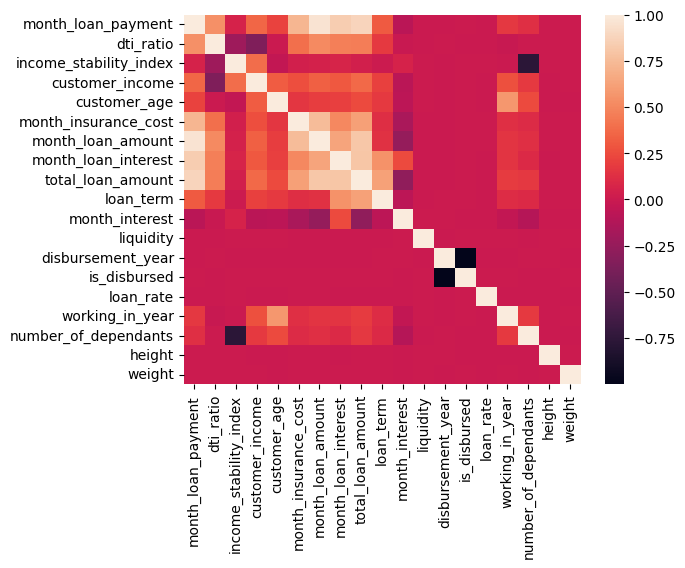

In [ ]:
sns.heatmap(df.corr(numeric_only=True), annot=False)
plt.show()

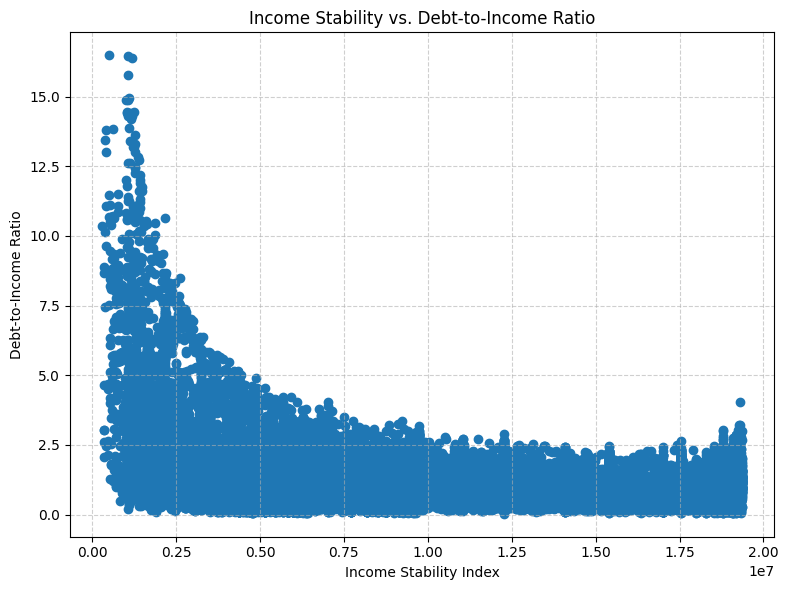

In [ ]:
plt.figure(figsize=(8, 6))
plt.scatter(x=df['income_stability_index'], y=df['dti_ratio'])
plt.title('Income Stability vs. Debt-to-Income Ratio')
plt.xlabel('Income Stability Index')
plt.ylabel('Debt-to-Income Ratio')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from mpl_toolkits.mplot3d import Axes3D
import plotly.express as px

In [ ]:
ml_df = df.copy().dropna()
features = ['income_stability_index', 'dti_ratio']
X = ml_df[features]

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(X_scaled)
ml_df['cluster'] = kmeans.labels_

print(ml_df.groupby('cluster')[features].mean())

         income_stability_index  dti_ratio
cluster                                   
0                  7.200694e+06   1.056362
1                  1.713418e+07   0.868344
2                  2.535091e+06   5.804797


In [ ]:
inertia = []
for i in range(1, 10):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

inertia.insert(0, None)
fig = px.line(
    x=[str(i) for i in range(0, 10)],
    y=inertia,
    markers=True,
)

fig.update_traces(line=dict(color='#F68F46'))

# Add a vertical line to indicate where n_clusters=3
fig.add_vline(x='3', line_width=2, line_dash="dash", line_color="#102449")

# Customize layout
fig.update_layout(
    xaxis_title='Number of Clusters',
    yaxis_title='Inertia',
    plot_bgcolor="white",
    height=400,
    width=600
)
fig.show()

In [ ]:
ml_df.columns

Index(['contract_no', 'month_loan_payment', 'dti_ratio',
       'income_stability_index', 'loan_purpose_description',
       'liquidity_description', 'creditibility_description', 'customer_income',
       'customer_age', 'month_insurance_cost', 'month_loan_amount',
       'month_loan_interest', 'total_loan_amount', 'loan_term',
       'month_interest', 'loan_purpose', 'liquidity', 'creditibility',
       'disbursement_year', 'is_disbursed', 'disbursement_date',
       'disbursement_channel', 'has_insurance', 'loan_rate',
       'product_category', 'business_line', 'labour_contract_type',
       'working_in_year', 'number_of_dependants', 'marital_status',
       'income_resource', 'accommodation_type', 'job', 'industry', 'education',
       'height', 'weight', 'company_address_province',
       'permanent_address_province', 'cluster', 'cluster_label'],
      dtype='object')

In [ ]:
colors = ['#F3B700','#F68F46','#440154']
cluster_labels = ['Group 1 - Avg', 'Group 2 - Low Risk', 'Group 3 - High Risk']
ml_df['cluster_label'] = ml_df['cluster'].map({0: cluster_labels[0], 1: cluster_labels[1], 2: cluster_labels[2]})

fig = px.scatter(
    ml_df,
    x='income_stability_index',
    y='dti_ratio',
    color='cluster_label',
    color_discrete_sequence=colors,
    labels={
        'income_stability_index': 'Income Stability Index',
        'dti_ratio': 'Debt-to-Income Ratio'
    },
    title='Customer Segmentation using KMeans',
    hover_data=['income_stability_index', 'dti_ratio', 'cluster_label']
)

fig.update_layout(
    legend_title='Clusters',
    legend=dict(
        orientation='h',
        yanchor='bottom',
        y=1.02,
        xanchor='right',
        x=1
    ),
    plot_bgcolor='rgba(0,0,0,0)',
    xaxis=dict(showgrid=False),
    yaxis=dict(showgrid=False),
    font=dict(family='Arial', size=18),
    height=600,
    width=1000
)

fig.show()

In [ ]:
import plotly.graph_objects as go

cluster_counts = ml_df['cluster'].value_counts()

fig = go.Figure(data=[go.Pie(
    values=cluster_counts,
    textinfo='label',
    marker=dict(colors=["#102449", "#ed783a", "#f7e500"])
)])

fig.update_layout(
    title='Customers in Each Cluster',
    font=dict(size=14),
    height=500,
    width=600
)

fig.show()


In [ ]:
import pandas as pd

# Assuming you have the cluster labels in 'cluster_labels' and the dataframe 'ml_df'
for index, cluster in enumerate(cluster_labels):
    print(f"{cluster} Demographics:")
    cluster_df = ml_df[ml_df['cluster'] == index]

    # Demographic Metrics
    print(f"- count: {len(cluster_df)}")
    print(f"- average age: {cluster_df['customer_age'].mean():,.1f}")
    print(f"- age range: {cluster_df['customer_age'].min():,.1f} - {cluster_df['customer_age'].max():,.1f}")
    print(f"- average income: {cluster_df['customer_income'].mean():,.1f}")
    print(f"- income range: {cluster_df['customer_income'].min():,.1f} - {cluster_df['customer_income'].max():,.1f}")
    print(f"- number of dependants (75th percentile): {cluster_df['number_of_dependants'].max():,.1f}")
    print(f"- average loan amount: {cluster_df['total_loan_amount'].mean():,.1f}")
    print(f"- loan amount range: {cluster_df['total_loan_amount'].min():,.1f} - {cluster_df['total_loan_amount'].max():,.1f}")
    print(f"- average loan term: {cluster_df['loan_term'].mean():,.1f}")
    print(f"- loan term range: {cluster_df['loan_term'].min():,.1f} - {cluster_df['loan_term'].max():,.1f}")
    print(f"- average loan interest rate: {cluster_df['loan_rate'].mean():,.2f}")
    print(f"- loan interest rate range: {cluster_df['loan_rate'].min():,.2f} - {cluster_df['loan_rate'].max():,.2f}")
    print(f"- average DTI ratio: {cluster_df['dti_ratio'].mean():,.2f}")

    # Behavioral Metrics
    print(f"- average monthly loan payment: {cluster_df['month_loan_payment'].mean():,.1f}")

    # Additional Metrics
    print(f"- average number of dependants: {cluster_df['number_of_dependants'].mean():,.1f}")
    print(f"- average working years: {cluster_df['working_in_year'].mean():,.1f}")

    print("-" * 50)


Group 1 - Avg Demographics:
- count: 21937
- average age: 37.0
- age range: 20.0 - 62.0
- average income: 15,629,498.4
- income range: 1,025,000.0 - 19,366,000.0
- number of dependants (75th percentile): 30.0
- average loan amount: 2,728,661.2
- loan amount range: 30,000.0 - 6,390,000.0
- average loan term: 25.7
- loan term range: 6.0 - 36.0
- average loan interest rate: 2.49
- loan interest rate range: 0.00 - 5.00
- average DTI ratio: 1.06
- average monthly loan payment: 155,366.5
- average number of dependants: 1.4
- average working years: 6.1
--------------------------------------------------
Group 2 - Low Risk Demographics:
- count: 19426
- average age: 35.2
- age range: 20.0 - 62.0
- average income: 17,134,183.6
- income range: 11,587,000.0 - 19,361,000.0
- number of dependants (75th percentile): 0.0
- average loan amount: 2,500,289.8
- loan amount range: 50,000.0 - 6,390,000.0
- average loan term: 24.9
- loan term range: 3.0 - 36.0
- average loan interest rate: 2.50
- loan intere

In [ ]:
ml_df[ml_df['cluster_label'] == 'Group 3 - High Risk'].loan_purpose_description.value_counts(sort=True)

,count
loan_purpose_description,
VEHICLE,197
SHOPPING,193
NULL,65
ACCOMODATION,44


In [ ]:
ml_df.columns

Index(['contract_no', 'month_loan_payment', 'dti_ratio',
       'income_stability_index', 'loan_purpose_description',
       'liquidity_description', 'creditibility_description', 'customer_income',
       'customer_age', 'month_insurance_cost', 'month_loan_amount',
       'month_loan_interest', 'total_loan_amount', 'loan_term',
       'month_interest', 'loan_purpose', 'liquidity', 'creditibility',
       'disbursement_year', 'is_disbursed', 'disbursement_date',
       'disbursement_channel', 'has_insurance', 'loan_rate',
       'product_category', 'business_line', 'labour_contract_type',
       'working_in_year', 'number_of_dependants', 'marital_status',
       'income_resource', 'accommodation_type', 'job', 'industry', 'education',
       'height', 'weight', 'company_address_province',
       'permanent_address_province', 'cluster', 'cluster_label'],
      dtype='object')

In [ ]:
for index, cluster in enumerate(cluster_labels):
    print(f"{cluster} Demographics:")
    cluster_df = ml_df[ml_df['cluster'] == index]
    print(f"- customer age: {cluster_df.customer_age.mean()}")

Group 1 - Avg Demographics:
- customer age: 37.00542462506268
Group 2 - Low Risk Demographics:
- customer age: 35.205652218676
Group 3 - High Risk Demographics:
- customer age: 30.909819639278556


In [ ]:
df_22 = ml_df[ml_df['disbursement_year'] == 2022]
df_23 = ml_df[ml_df['disbursement_year'] == 2023]

In [ ]:
average_loan_22 = df_22['total_loan_amount'].mean()
average_loan_23 = df_23['total_loan_amount'].mean()
min_loan_22 = df_22['total_loan_amount'].min()
max_loan_22 = df_22['total_loan_amount'].max()
min_loan_23 = df_23['total_loan_amount'].min()
max_loan_23 = df_23['total_loan_amount'].max()

print(f"2022 - Average: {average_loan_22}, Min: {min_loan_22}, Max: {max_loan_22}")
print(f"2023 - Average: {average_loan_23}, Min: {min_loan_23}, Max: {max_loan_23}")

2022 - Average: 2416389.383793082, Min: 30000.0, Max: 6380000.0
2023 - Average: 2797113.8127263323, Min: 260000.0, Max: 6390000.0


In [ ]:
age_loan_type_22 = df_22.groupby('loan_purpose_description')['customer_age'].mean().astype("Int64")
age_loan_type_23 = df_23.groupby('loan_purpose_description')['customer_age'].mean().astype("Int64")

df_age_loan_22 = age_loan_type_22.reset_index(name='average_age')
df_age_loan_22['year'] = '2022'

df_age_loan_23 = age_loan_type_23.reset_index(name='average_age')
df_age_loan_23['year'] = '2023'

df_combined = pd.concat([df_age_loan_22, df_age_loan_23])
df_combined = df_combined[df_combined["loan_purpose_description"] != 'NULL']

colors = {'2022': '#102449', '2023': '#e57731'}

# Update the 'color_discrete_map' parameter in px.bar() to use the custom colors
fig = px.bar(
    df_combined,
    x='loan_purpose_description',
    y='average_age',
    color='year',
    barmode='group',
    title='Average Customer Age by Loan Purpose (2022 vs 2023)',
    labels={'loan_purpose_description': 'Loan Purpose Description', 'average_age': 'Average Customer Age'},
    text='average_age',
    color_discrete_map=colors  # Specify the custom colors for each year
)

fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(
    xaxis_title='Loan Purpose Description',
    yaxis_title='Average Customer Age',
    legend_title='Year',
    xaxis={'categoryorder': 'total ascending'},
    plot_bgcolor='rgba(0,0,0,0)',
    font=dict(
        family='Arial',
        size=15,
    )
)

fig.show()

In [ ]:
healthcare = ml_df[ml_df['loan_purpose_description'] == 'HEALTHCARE']

In [ ]:
cluster_counts

,count
cluster,
0,21937
1,19426
2,499


In [ ]:
old_df = ml_df[ml_df['customer_age'] > 55]

cluster_counts = old_df['cluster_label'].value_counts()

fig = go.Figure(data=[go.Pie(
    values=cluster_counts,
    labels=cluster_counts.index.unique(),
    marker=dict(colors=["#102449", "#ed783a", "#f7e500"])
)])

fig.update_layout(
    title='Customers in Each Cluster',
    font=dict(size=14),
    height=500,
    width=600
)

fig.show()


In [ ]:
healthcare.cluster_label.value_counts()

,count
cluster_label,
Group 1 - Avg,2
Group 2 - Low Risk,2


In [ ]:
import plotly.graph_objects as go


# Sample data preparation (adjust it based on your actual data)
df_2022_disbursed = ml_df[(ml_df['disbursement_year'] == 2022) & (ml_df['is_disbursed'] == 1)]
df_2022_disbursed['disbursement_date'] = pd.to_datetime(df_2022_disbursed['disbursement_date'])
df_2022_disbursed['disbursement_month'] = df_2022_disbursed['disbursement_date'].dt.month

df_2023_disbursed = ml_df[(ml_df['disbursement_year'] == 2023) & (ml_df['is_disbursed'] == 1)]
df_2023_disbursed['disbursement_date'] = pd.to_datetime(df_2023_disbursed['disbursement_date'])
df_2023_disbursed['disbursement_month'] = df_2023_disbursed['disbursement_date'].dt.month

# Calculate average FA by month for each year
average_fa_by_month_2022 = df_2022_disbursed.groupby('disbursement_month')['total_loan_amount'].mean().tolist()
average_fa_by_month_2023 = df_2023_disbursed.groupby('disbursement_month')['total_loan_amount'].mean().tolist()

months = list(range(1, 13))

# Define colors
colors = {'2022': '#102449', '2023': '#e57731'}

# Find high and low peaks for each year
peak_2022_high = max(average_fa_by_month_2022)
peak_2022_low = min(average_fa_by_month_2022)
peak_2023_high = max(average_fa_by_month_2023)
peak_2023_low = min(average_fa_by_month_2023)

# Identify the corresponding months
peak_2022_high_month = months[average_fa_by_month_2022.index(peak_2022_high)]
peak_2022_low_month = months[average_fa_by_month_2022.index(peak_2022_low)]

peak_2023_high_month = months[average_fa_by_month_2023.index(peak_2023_high)]
peak_2023_low_month = months[average_fa_by_month_2023.index(peak_2023_low)]

# Create traces with thicker lines
trace1 = go.Scatter(
    x=months, y=average_fa_by_month_2022,
    mode='lines+markers',
    name='2022',
    line=dict(color=colors['2022'], width=6),
    marker=dict(color=colors['2022'])
)

trace2 = go.Scatter(
    x=months, y=average_fa_by_month_2023,
    mode='lines+markers',
    name='2023',
    line=dict(color=colors['2023'], width=6),
    marker=dict(color=colors['2023'])
)

# Create figure and add traces
fig = go.Figure()
fig.add_trace(trace1)
fig.add_trace(trace2)

# Add annotations for high and low peaks (with commas)
# High and Low peaks for 2022
fig.add_trace(go.Scatter(
    x=[peak_2022_high_month], y=[peak_2022_high],
    mode='markers+text',
    marker=dict(size=18, color=colors['2022'], symbol='circle'),
    text=[f'{peak_2022_high:,.0f}'],
    textposition='top center',
    showlegend=False
))

fig.add_trace(go.Scatter(
    x=[peak_2022_low_month], y=[peak_2022_low],
    mode='markers+text',
    marker=dict(size=18, color=colors['2022'], symbol='circle'),
    text=[f'{peak_2022_low:,.0f}'],
    textposition='bottom center',
    showlegend=False
))

# High and Low peaks for 2023
fig.add_trace(go.Scatter(
    x=[peak_2023_high_month], y=[peak_2023_high],
    mode='markers+text',
    marker=dict(size=18, color=colors['2023'], symbol='circle'),
    text=[f'{peak_2023_high:,.0f}'],
    textposition='top center',
    showlegend=False
))

fig.add_trace(go.Scatter(
    x=[peak_2023_low_month], y=[peak_2023_low],
    mode='markers+text',
    marker=dict(size=18, color=colors['2023'], symbol='circle'),
    text=[f'{peak_2023_low:,.0f}'],
    textposition='bottom center',
    showlegend=False
))

# Update layout
fig.update_layout(
    title='Average FA by Month for 2022 and 2023',
    xaxis_title='Month',
    yaxis_title='Average FA',
    xaxis=dict(tickmode='linear'),
    plot_bgcolor='rgba(0,0,0,0)',
    font=dict(family='Arial', size=20),
    legend=dict(title='Year', orientation='h', y=1.1, x=0.5, xanchor='center'),
    height=600,
    width=1100
)

fig.show()

<ipython-input-22-7edbabb01e00>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-22-7edbabb01e00>:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-22-7edbabb01e00>:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-22-7edbab

In [ ]:
import pandas as pd
import plotly.graph_objects as go
from prophet import Prophet

df_disbursed = ml_df[(ml_df['is_disbursed'] == 1) & (ml_df['disbursement_year'].isin([2022, 2023]))]
df_disbursed['disbursement_date'] = pd.to_datetime(df_disbursed['disbursement_date'])

df_disbursed['disbursement_month'] = df_disbursed['disbursement_date'].dt.to_period('M')
monthly_avg_fa = df_disbursed.groupby('disbursement_month')['total_loan_amount'].mean().reset_index()
monthly_avg_fa['disbursement_month'] = monthly_avg_fa['disbursement_month'].dt.to_timestamp()

prophet_df = monthly_avg_fa.rename(columns={'disbursement_month': 'ds', 'total_loan_amount': 'y'})

model = Prophet(weekly_seasonality=True, daily_seasonality=False, changepoint_prior_scale=0.1)
model.add_country_holidays(country_name='VN')
model.fit(prophet_df)

future = model.make_future_dataframe(periods=6, freq='M')
forecast = model.predict(future)

forecast['y'] = forecast['yhat']
combined_df = pd.concat([prophet_df, forecast[['ds', 'y']].tail(6)]).reset_index(drop=True)

split_date = prophet_df['ds'].max()

historical_data = combined_df[combined_df['ds'] <= split_date]
forecast_data = combined_df[combined_df['ds'] > split_date]

fig = go.Figure()

fig.add_trace(go.Scatter(
    x=historical_data['ds'],
    y=historical_data['y'],
    mode='lines+markers',
    name='Historical Data',
    marker=dict(size=15, color='#102449'),
    line=dict(color='#102449', width=6)
))

fig.add_trace(go.Scatter(
    x=forecast_data['ds'],
    y=forecast_data['y'],
    mode='lines+markers',
    name='Forecasted Data',
    marker=dict(size=15, color='#e57731'),
    line=dict(color='#e57731', width=6),
    showlegend=True
))


fig.add_trace(go.Scatter(
    x=[historical_data['ds'].iloc[-1], forecast_data['ds'].iloc[0]],
    y=[historical_data['y'].iloc[-1], forecast_data['y'].iloc[0]],
    mode='lines',
    line=dict(color='#e57731', width=6),
    showlegend=False
))


fig.update_layout(
    title='Average FA for 2022, 2023 & Forecast for Jan-Jun 2024',
    xaxis_title='Date',
    yaxis_title='Average FA',
    xaxis=dict(
        tickmode='array',
        tickvals=pd.date_range(start='2022-01-01', end='2024-06-01', freq='3M'),
        ticktext=pd.date_range(start='2022-01-01', end='2024-06-01', freq='3M').strftime('%b %Y'),
        dtick="M3"
    ),
    plot_bgcolor='rgba(0,0,0,0)',
    font=dict(family='Arial', size=22),
    legend=dict(title='Data', orientation='h', y=1.1, x=0.5, xanchor='center'),
    height=600,
    width=1400
)

fig.show()


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 18.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm34_ure/ps835ow4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxm34_ure/uahd1ki2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=75424', 'data', 'file=/tmp/tmpxm34_ure/ps835ow4.json', 'init=/tmp/tmpxm34_ure/uahd1ki2.json', 'output', 'file=/tmp/tmpxm34_ure/prophet_model0_pf545f/prophet_model-20241112134637.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
13:46:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:46:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [ ]:
raw_df = bq_client.query('SELECT * FROM `rbac-2024-shbfinance.credit_risk_raw.loan_origin`').to_dataframe()

loan_purpose_mapping = {
    0: "HEALTHCARE",
    1: "ACCOMODATION",
    2: "EDUCATION",
    3: "SHOPPING",
    4: "BILLS",
    5: "TRAVEL",
    6: "VEHICLE",
}

raw_df['LOAN_DESC'] = raw_df['LOAN_PURPOSE'].map(loan_purpose_mapping)
raw_df['LOAN_DESC'] = raw_df['LOAN_PURPOSE'].map(loan_purpose_mapping).fillna("NULL")

import plotly.express as px

# Assuming 'ml_df' is your DataFrame
fig = px.box(raw_df, x="LOAN_DESC", y="LOAN_AMOUNT", color="LOAN_DESC",
             category_orders={"LOAN_DESC": ["NULL", "SHOPPING", "ACCOMODATION", "VEHICLE", "BILLS", "HEALTHCARE", "EDUCATION", "TRAVEL"]},
             color_discrete_sequence=["#ed783a"] * 8)  # Set the color for all categories

fig.update_layout(
    xaxis_title="Loan Purpose Description",
    yaxis_title="Loan Amount",
    title="Loan Amount by Loan Purpose Description",
    plot_bgcolor='rgba(0,0,0,0)',  # Set background to transparent
    font=dict(
        family='Arial',
        size=14,
    ),
    height=500,
    width=1000
)

fig.show()